In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("amex_training.csv", low_memory=False)
data.head()

,application_key,mvar1,mvar2,mvar3,mvar4,mvar5,mvar6,mvar7,mvar8,mvar9,...,mvar43,mvar44,mvar45,mvar46,mvar47,mvar48,mvar49,mvar50,mvar51,default_ind
0,230032,1696,1.6541,0.000,0.0,0.0,0,6015,322,40369,...,10,0.63899,na,0,C,10,770,4,3080,0
1,230033,1846,0.8095,0.000,0.0,0.0,102,7532,3171,18234,...,13,0.63836,na,na,L,732,437,5,2185,1
2,230034,1745,0.4001,0.000,0.0,0.0,missing,2536,missing,missing,...,1,1.00000,na,0,C,89,795,4,3180,1
3,230035,1739,0.2193,0.000,0.0,0.0,1982,26440,4955,20316,...,3,0.53241,0,0,L,3,755,4,3020,0
4,230036,1787,0.0118,0.225,0.0,0.0,5451,5494,5494,7987,...,1,0.92665,na,na,L,5,425,4,1700,0


In [85]:
data1 = pd.read_csv("amex_training.csv", low_memory=False)

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83000 entries, 0 to 82999
Data columns (total 53 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   application_key  83000 non-null  int64  
 1   mvar1            83000 non-null  object 
 2   mvar2            77114 non-null  float64
 3   mvar3            82465 non-null  float64
 4   mvar4            82465 non-null  float64
 5   mvar5            82465 non-null  float64
 6   mvar6            83000 non-null  object 
 7   mvar7            83000 non-null  object 
 8   mvar8            83000 non-null  object 
 9   mvar9            83000 non-null  object 
 10  mvar10           83000 non-null  object 
 11  mvar11           83000 non-null  object 
 12  mvar12           83000 non-null  object 
 13  mvar13           83000 non-null  object 
 14  mvar14           83000 non-null  int64  
 15  mvar15           83000 non-null  object 
 16  mvar16           83000 non-null  object 
 17  mvar17      

In [4]:
for i in data.columns:
    print(data[i].unique())

[230032 230033 230034 ... 578066 578067 578068]
['1696' '1846' '1745' '1739' '1787' '1579' '1818' 'na' '1836' '1839'
 '1903' '1681' '1841' '1794' '1669' '1583' '1899' '1690' '1599' '1859'
 '1880' '1852' '1655' '1863' '1753' '1894' '1803' '1932' '1714' '1768'
 '1834' '1837' '1785' '1889' '1751' '1907' '1765' '1724' '1721' '1858'
 '1797' '1817' '1650' '1712' '1868' '1654' '1711' '1902' '1606' '1649'
 '1644' '1760' '1812' '1636' '1766' '1792' '1750' '1642' '1826' '1872'
 '1653' '1802' '1806' '1741' '1939' '1743' '1744' '1615' '1919' '1687'
 '1706' '1544' '1667' '1671' '1609' '1896' '1596' '1610' '1727' '1790'
 '1695' '1796' '1861' '1873' '1854' '1621' '1688' '1665' '1823' '1630'
 '1693' '1683' '1761' '1850' '1853' '1605' '1924' '1573' '1677' '1620'
 '1657' '1720' '1804' '1777' '1895' '1830' '1821' '1793' '1819' '1833'
 '1888' '1898' '1929' '1808' '1950' '1771' '1901' '1831' '1719' '1925'
 '1791' '1864' '1922' '1855' '1900' '1733' '1725' '1800' '1920' '1735'
 '1780' '1773' '1893' '1784' '1

In [5]:
# data.columns = ['application_key', 'credit_score', 'credit_lender_score', 'default_loan', 'default_auto_loan', 'default_educ_loan', 'min_rev_credit_avail', 'max_act_credit_avail', 'max_act_rev_credit_avail', 'sum_avail_credit_miss1_payment', 'credit_available', '']

In [6]:
data = data.replace(to_replace = 'na', value = np.nan, regex = False)
data = data.replace(to_replace = 'missing', value = np.nan, regex = False)
data = data.replace(to_replace = '#VALUE!', value = -1, regex = False)

In [7]:
data.isnull().sum()

application_key        0
mvar1               3733
mvar2               5886
mvar3                535
mvar4                535
mvar5                535
mvar6              19701
mvar7               7674
mvar8              19709
mvar9              11682
mvar10               535
mvar11             46717
mvar12             14578
mvar13              9689
mvar14                 0
mvar15             33519
mvar16             19243
mvar17             16499
mvar18             15359
mvar19                 5
mvar20               535
mvar21             23462
mvar22             30668
mvar23             42311
mvar24             19530
mvar25              7862
mvar26             10929
mvar27             13650
mvar28               535
mvar29               535
mvar30             37988
mvar31             58539
mvar32              7862
mvar33              1869
mvar34               535
mvar35             34868
mvar36              3159
mvar37              7862
mvar38               535
mvar39              6329


In [8]:
col = ['mvar1', 'mvar2', 'mvar3', 'mvar4', 'mvar5', 'mvar6',
       'mvar7', 'mvar8', 'mvar9', 'mvar10', 'mvar11', 'mvar12', 'mvar13',
       'mvar14', 'mvar15', 'mvar16', 'mvar17', 'mvar18', 'mvar19', 'mvar20',
       'mvar21', 'mvar22', 'mvar23', 'mvar24', 'mvar25', 'mvar26', 'mvar27',
       'mvar28', 'mvar29', 'mvar30', 'mvar31', 'mvar32', 'mvar33', 'mvar34',
       'mvar35', 'mvar36', 'mvar37', 'mvar38', 'mvar39', 'mvar40', 'mvar41',
       'mvar42', 'mvar43', 'mvar44', 'mvar45', 'mvar46', 'mvar48',
       'mvar49', 'mvar50', 'mvar51']
for i in col:
    data[i] = data[i].astype('float64')

<AxesSubplot:>

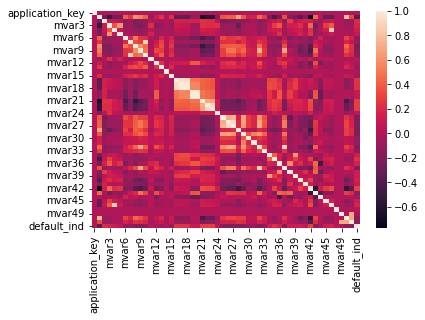

In [9]:
sns.heatmap(data.corr())

<AxesSubplot:xlabel='count', ylabel='mvar47'>

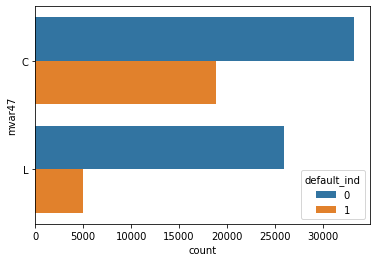

In [10]:
sns.countplot(y=data['mvar47'],hue=data['default_ind'])

<Figure size 504x1080 with 0 Axes>

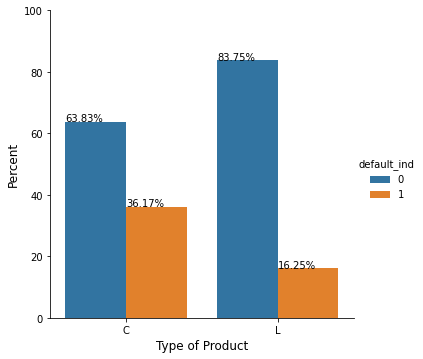

In [11]:
df = data.groupby('mvar47')['default_ind'].value_counts(normalize=True)
df = df.mul(100)
df = df.rename('Percent').reset_index()

plt.figure(figsize=(7,15))
g = sns.catplot(x='mvar47', y='Percent', hue='default_ind', kind='bar', data=df)
g.ax.set_ylim(0,100)
plt.ylabel('Percent', fontsize=12)
plt.xlabel('Type of Product', fontsize=12)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

In [63]:
data = data.fillna(data.mean())

In [64]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, roc_auc_score

data['mvar47'] = np.where(data['mvar47'] == 'C', 0, 1)
X = data.drop(['default_ind', 'application_key'], axis=1)
Y = data['default_ind']

In [65]:
from sklearn.preprocessing import StandardScaler
# Scaling the test dataset
scaler = StandardScaler()

In [66]:
from xgboost import XGBClassifier
xgb = XGBClassifier(max_depth = 20, learning_rate=0.22000235)
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size = 0.3,random_state = 0)

In [67]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [68]:
xgb.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.22000235, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [69]:
Y_pred = xgb.predict(X_test)
accuracy_score(Y_test,Y_pred) 

0.7484738955823294

In [70]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [71]:
pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [72]:
xgb.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.22000235, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=20, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [73]:
Y_pred = xgb.predict(X_test)
accuracy_score(Y_test,Y_pred) 

0.7520883534136547

In [74]:
  import catboost as ctb

In [75]:
model_CBC = ctb.CatBoostClassifier()
model_CBC.fit(X_train, Y_train)


Learning rate set to 0.058376
0:	learn: 0.6723550	total: 26ms	remaining: 26s
1:	learn: 0.6531684	total: 49ms	remaining: 24.4s
2:	learn: 0.6363245	total: 75.1ms	remaining: 24.9s
3:	learn: 0.6217034	total: 99.3ms	remaining: 24.7s
4:	learn: 0.6083821	total: 125ms	remaining: 24.8s
5:	learn: 0.5968307	total: 149ms	remaining: 24.6s
6:	learn: 0.5883405	total: 174ms	remaining: 24.7s
7:	learn: 0.5802131	total: 201ms	remaining: 25s
8:	learn: 0.5725980	total: 229ms	remaining: 25.2s
9:	learn: 0.5655802	total: 254ms	remaining: 25.2s
10:	learn: 0.5595146	total: 278ms	remaining: 25s
11:	learn: 0.5541781	total: 304ms	remaining: 25s
12:	learn: 0.5495187	total: 328ms	remaining: 24.9s
13:	learn: 0.5457572	total: 352ms	remaining: 24.8s
14:	learn: 0.5415425	total: 374ms	remaining: 24.5s
15:	learn: 0.5378629	total: 400ms	remaining: 24.6s
16:	learn: 0.5347357	total: 425ms	remaining: 24.5s
17:	learn: 0.5322258	total: 452ms	remaining: 24.6s
18:	learn: 0.5297531	total: 474ms	remaining: 24.5s
19:	learn: 0.527766

In [76]:
Y_pred = model_CBC.predict(X_test)

In [77]:
accuracy_score(Y_test,Y_pred) 

0.7585542168674699

In [78]:
pca = PCA()
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

In [84]:
from pandas_profiling import ProfileReport 

C:\Users\sejal\AppData\Roaming\Python\Python310\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [88]:
profile = ProfileReport(data1)
profile

Render HTML: 100%|███████████████████████████████████████████████████████████████████████| 1/1 [00:12<00:00, 12.57s/it]


In [ ]:
profile = ProfileReport(data)
profile

Render HTML:   0%|                                                                               | 0/1 [00:00<?, ?it/s]